In [1]:
!pip install dmba

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 35.3 MB/s eta 0:00:00


In [2]:
%matplotlib inline
import warnings
from pathlib import Path

import pandas as pd
import numpy as np
import math
import dmba
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, accuracy_score
from dmba import plotDecisionTree, regressionSummary, classificationSummary

Colab environment detected.


In [3]:
car_df = dmba.load_data('ToyotaCorolla.csv')
# Select the required columns
columns = ['Price', 'Age_08_04', 'KM', 'Fuel_Type', 'HP', 'Automatic',
           'Doors', 'Quarterly_Tax', 'Mfr_Guarantee', 'Guarantee_Period',
           'Airco', 'Automatic_airco', 'CD_Player', 'Powered_Windows',
           'Sport_Model', 'Tow_Bar']

car_df = car_df[columns]

# Convert Fuel_Type to dummy variables
car_df = pd.get_dummies(car_df, drop_first=True)

# Make sure that the result is as expected
car_df.head()

,Price,Age_08_04,KM,HP,Automatic,Doors,Quarterly_Tax,Mfr_Guarantee,Guarantee_Period,Airco,Automatic_airco,CD_Player,Powered_Windows,Sport_Model,Tow_Bar,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,3,210,0,3,0,0,0,1,0,0,1,0
1,13750,23,72937,90,0,3,210,0,3,1,0,1,0,0,0,1,0
2,13950,24,41711,90,0,3,210,1,3,0,0,0,0,0,0,1,0
3,14950,26,48000,90,0,3,210,1,3,0,0,0,0,0,0,1,0
4,13750,30,38500,90,0,3,210,1,3,1,0,0,1,0,0,1,0


In [4]:
X = car_df.drop(columns='Price')
y = car_df['Price']

train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)
print('Training set:', train_X.shape, 'Validation set:', valid_X.shape)

Training set: (861, 16) Validation set: (575, 16)



Run a regression tree (RT) with the output variable Price and input variables Age_08_04, KM, Fuel_Type (= Petrol and Diesel), HP, Automatic,
Doors, Quarterly_Tax, Mfr_Guarantee, Guarantee_Period, Airco, Automatic_Airco, CD_Player, Powered_Windows, Sport_Model, and Tow_Bar.

Fit a deep regression tree and compare its prediction errors in the training and validation sets

In [5]:
# setting random state will ensure that the same tree is produced every time
deepTree = DecisionTreeRegressor(random_state=1)
deepTree.fit(train_X, train_y)

print('Tree has {} nodes'.format(deepTree.tree_.node_count))
plotDecisionTree(deepTree, feature_names=train_X.columns, impurity=False)

Tree has 1485 nodes


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.996412 to fit


Which appear to be the three or four most important car specifications for predicting the car’s price? Use the <code>feature_importances_</code> property of the tree.

In [6]:
importance = pd.DataFrame({'features': train_X.columns,
                           'importance': deepTree.feature_importances_})
importance.sort_values(by='importance', ascending=False)

,features,importance
0,Age_08_04,0.844867
2,HP,0.053789
1,KM,0.049601
9,Automatic_airco,0.013358
5,Quarterly_Tax,0.006769
11,Powered_Windows,0.005221
4,Doors,0.004864
8,Airco,0.004727
12,Sport_Model,0.004459
6,Mfr_Guarantee,0.003714


Compare the prediction errors of the training, and validation, by examining their RMSE.

In [7]:
regressionSummary(train_y, deepTree.predict(train_X))
regressionSummary(valid_y, deepTree.predict(valid_X))


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 0.0000
            Mean Absolute Error (MAE) : 0.0000
          Mean Percentage Error (MPE) : 0.0000
Mean Absolute Percentage Error (MAPE) : 0.0000

Regression statistics

                      Mean Error (ME) : 76.6557
       Root Mean Squared Error (RMSE) : 1492.3365
            Mean Absolute Error (MAE) : 1152.4852
          Mean Percentage Error (MPE) : -0.3363
Mean Absolute Percentage Error (MAPE) : 11.3783


## Grid search

Redo the tree, this time adjusting the parameters to yield a shallower tree. Compare the RMSE to the deeper tree.

Tree has 59 nodes


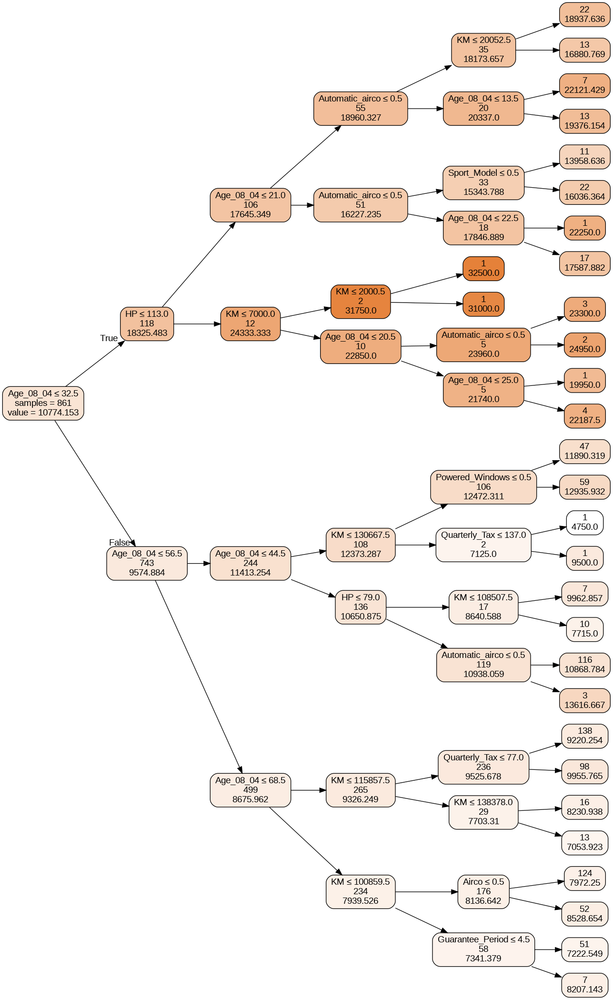

In [8]:
shallowTree = DecisionTreeRegressor(max_depth=5)
shallowTree.fit(train_X, train_y)
print('Tree has {} nodes'.format(shallowTree.tree_.node_count))
plotDecisionTree(shallowTree, feature_names=train_X.columns, rotate=True, impurity=False)

In [9]:
regressionSummary(train_y, shallowTree.predict(train_X))
regressionSummary(valid_y, shallowTree.predict(valid_X))


Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 1028.0279
            Mean Absolute Error (MAE) : 773.2770
          Mean Percentage Error (MPE) : -1.0039
Mean Absolute Percentage Error (MAPE) : 7.6715

Regression statistics

                      Mean Error (ME) : 50.8857
       Root Mean Squared Error (RMSE) : 1144.3038
            Mean Absolute Error (MAE) : 901.5381
          Mean Percentage Error (MPE) : -0.8040
Mean Absolute Percentage Error (MAPE) : 9.1723


In [12]:
importance = pd.DataFrame({'features': train_X.columns,
                           'importance': shallowTree.feature_importances_})
importance.sort_values(by='importance', ascending=False)

,features,importance
0,Age_08_04,0.889506
2,HP,0.051354
1,KM,0.033701
9,Automatic_airco,0.014461
5,Quarterly_Tax,0.003873
12,Sport_Model,0.002900
11,Powered_Windows,0.002620
8,Airco,0.001039
7,Guarantee_Period,0.000547
3,Automatic,0.000000


For the shallower tree, the RMSE values of training and validation sets are comparable. Compared to the deep tree, the RMSE of the validation set is lower.
This shallower tree does much worse on the training set than the deep tree but does better in predicting rows in the validation set. **This indicates a more robust model.**

Determine an optimal set of parameters (<code>max_depth</code>, <code>min_impurity_decrease</code>, <code>min_samples_split</code>) using cross-validated grid search.

Initial parameters:  {'max_depth': 10, 'min_impurity_decrease': 0, 'min_samples_split': 20}
Improved parameters:  {'max_depth': 6, 'min_impurity_decrease': 0, 'min_samples_split': 21}
Tree has 61 nodes


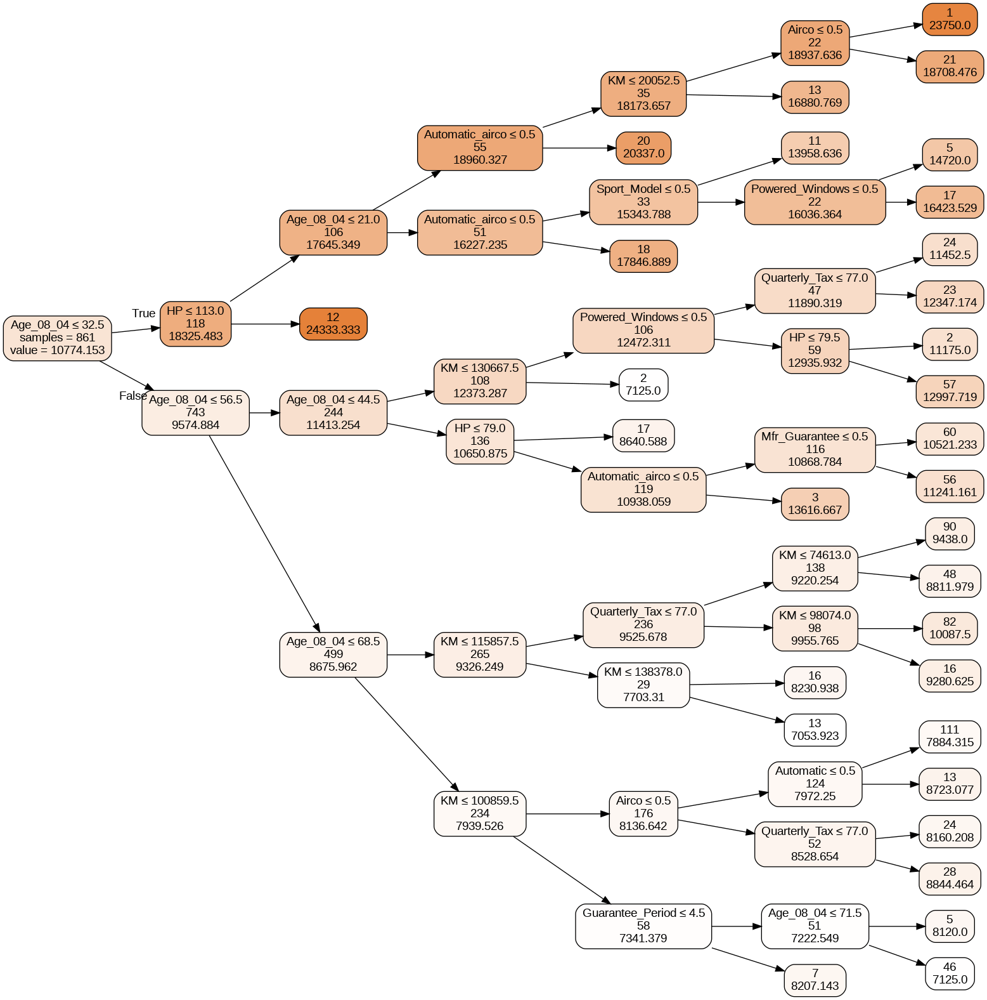

In [10]:
# user grid search to find optimized tree
param_grid = {
    'max_depth': [5, 10, 15, 20, 25],
    'min_impurity_decrease': [0, 0.001, 0.005, 0.01],
    'min_samples_split': [10, 20, 30, 40, 50],
}
gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=1),
                          param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Initial parameters: ', gridSearch.best_params_)

param_grid = {
    'max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13],
    'min_impurity_decrease': [0, 0.001, 0.002, 0.003, 0.004, 0.005,
                              0.006, 0.007],
    'min_samples_split': [17, 18, 19, 20, 21, 22, 23],
}
gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=1),
                          param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

optRegTree = gridSearch.best_estimator_

importanceRT = pd.DataFrame({'features': train_X.columns,
                             'importance': deepTree.feature_importances_})

print('Tree has {} nodes'.format(optRegTree.tree_.node_count))
plotDecisionTree(optRegTree, feature_names=train_X.columns, rotate=True)

In [11]:
regressionSummary(train_y, optRegTree.predict(train_X))
regressionSummary(valid_y, optRegTree.predict(valid_X))


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 1100.9381
            Mean Absolute Error (MAE) : 799.4101
          Mean Percentage Error (MPE) : -1.0081
Mean Absolute Percentage Error (MAPE) : 7.6852

Regression statistics

                      Mean Error (ME) : 23.7040
       Root Mean Squared Error (RMSE) : 1240.2015
            Mean Absolute Error (MAE) : 950.0088
          Mean Percentage Error (MPE) : -1.0616
Mean Absolute Percentage Error (MAPE) : 9.5168


In [13]:
importance = pd.DataFrame({'features': train_X.columns,
                           'importance': optRegTree.feature_importances_})
importance.sort_values(by='importance', ascending=False)

,features,importance
0,Age_08_04,0.894346
2,HP,0.052586
1,KM,0.021789
9,Automatic_airco,0.014338
5,Quarterly_Tax,0.004307
11,Powered_Windows,0.003692
8,Airco,0.003301
12,Sport_Model,0.002936
6,Mfr_Guarantee,0.001392
3,Automatic,0.000759
